In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge, SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor, BaggingRegressor
from sklearn.preprocessing import StandardScaler,MinMaxScaler, RobustScaler
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb
import lightgbm as lgb 
from scipy import stats
import catboost as cb
from sklearn.model_selection import KFold, cross_val_score

In [37]:

dfz1 = pd.read_csv('C:/Users/Balaji/Documents/tshr/python_projects/house-prices-advanced-regression-techniques/test_final.csv')
dfz = pd.read_csv('C:/Users/Balaji/Documents/tshr/python_projects/house-prices-advanced-regression-techniques/train_final.csv')
sub = pd.read_csv('C:/Users/Balaji/Documents/tshr/python_projects/house-prices-advanced-regression-techniques/sample_submission.csv')


In [38]:
print(dfz['SalePrice'].skew(),'   ',dfz['SalePrice'].kurt())

1.8893711400226196     6.720728234995125


In [39]:
dfz['SalePrice'] = np.log1p(dfz['SalePrice'])

In [40]:
dz = pd.concat([dfz[['OverallQual','GarageCars','TotRmsAbvGrd','FullBath']], 
                dfz1[['OverallQual','GarageCars','TotRmsAbvGrd','FullBath']]], sort=False)

for i in ['OverallQual','GarageCars','TotRmsAbvGrd','FullBath']:
    dummy1= pd.get_dummies(dz[i], prefix = i, drop_first = True)
    dz = pd.concat([dz,dummy1], axis= 1)

dz = dz.drop(['OverallQual','GarageCars','TotRmsAbvGrd','FullBath'],axis=1)
dfz = dfz.drop(['OverallQual','GarageCars','TotRmsAbvGrd','FullBath'],axis=1)
dfz1 = dfz1.drop(['OverallQual','GarageCars','TotRmsAbvGrd','FullBath'],axis=1)

df_feats = dz.iloc[:1453, 38:]
df1_feats = dz.iloc[1453:,38:]

df_final = pd.concat([dfz,df_feats], axis= 1)
df1_final = pd.concat([dfz1,df1_feats], axis= 1)

In [41]:

np.random.seed(62)
y = df_final['SalePrice']    
X = df_final.drop(['SalePrice'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=62)

# for submission
# X_train = X
# X_test = df1_final
# y_train = y


sc_X = RobustScaler()
X2 = sc_X.fit_transform(X)
X2_train = sc_X.transform(X_train)
X2_test = sc_X.transform(X_test)


In [42]:
import sklearn
sorted(sklearn.metrics.SCORERS.keys())

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',
 'roc_auc',
 'roc_auc_ovo',
 'roc_auc_ovo_weighted',
 'roc_auc_ovr',
 'roc_auc_ovr_weighted',
 'v_measure_score']

In [43]:
kf = KFold(n_splits=5, random_state=62, shuffle=True)
def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, X2_train, y_train, scoring="neg_mean_squared_error", cv=kf))
    return rmse.mean()

with non-scaled features:
5926062003.87169
Linear Regression Performance:
MAE: 44831782075.58032
RMSE: 410935722372.7751
R2_Score:  -1.0331490459079545e+24


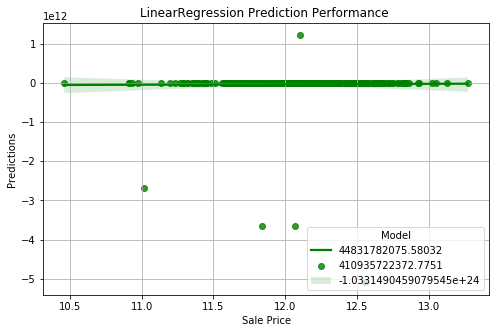

In [44]:
print('with non-scaled features:')
lm1 = LinearRegression()#0.793273393
print(cv_rmse(lm1))
lm1.fit(X2_train,y_train)
lm1_pred = lm1.predict(X2_test)
print('Linear Regression Performance:')
MAE = metrics.mean_absolute_error(y_test, lm1_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, lm1_pred))
R2_Score = metrics.r2_score(y_test, lm1_pred)
print('MAE:', metrics.mean_absolute_error(y_test, lm1_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, lm1_pred)))
print('R2_Score: ', metrics.r2_score(y_test, lm1_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,lm1_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('LinearRegression Prediction Performance ')  
plt.grid()
MAE = metrics.mean_absolute_error(y_test, lm1_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, lm1_pred))
R2_Score = metrics.r2_score(y_test, lm1_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()
# print('Estimated coefficients for the linear regression: ',lm1.coef_)
# print('Independent term: ', lm1.intercept_)

with scaled features:
0.39561138317997674
Lasso Regression Performance:
MAE: 0.31473607975897155
RMSE: 0.40448843384250194
R2_Score:  -0.0009846153907784316


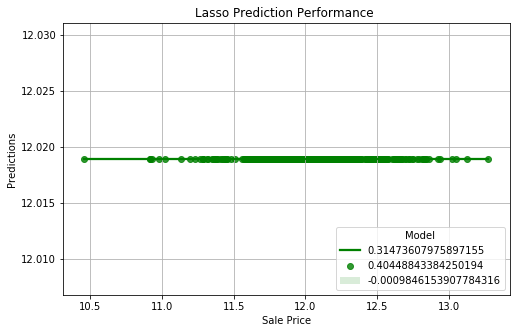

In [45]:
print('with scaled features:')
ls2 = Lasso()#0.79904
print(cv_rmse(ls2))
ls2.fit(X2_train,y_train)
ls2_pred = ls2.predict(X2_test)
print('Lasso Regression Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, ls2_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, ls2_pred)))
print('R2_Score: ', metrics.r2_score(y_test, ls2_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,ls2_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('Lasso Prediction Performance ') 
plt.grid()
MAE = metrics.mean_absolute_error(y_test, ls2_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, ls2_pred))
R2_Score = metrics.r2_score(y_test, ls2_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()

with scaled features:
0.5085118062512706
SGDRegressor Performance:
MAE: 0.35442756546369886
RMSE: 0.4780051358937098
R2_Score:  -0.3979135452860354


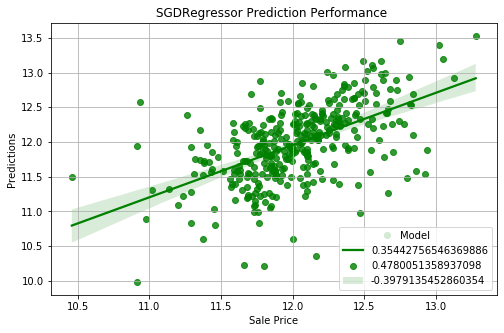

In [46]:
print('with scaled features:')
sgd = SGDRegressor()#0.8066
print(cv_rmse(sgd))
sgd.fit(X2_train,y_train)
sgd_pred = sgd.predict(X2_test)
print('SGDRegressor Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, sgd_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, sgd_pred)))
print('R2_Score: ', metrics.r2_score(y_test, sgd_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,sgd_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('SGDRegressor Prediction Performance ') 
plt.grid()
MAE = metrics.mean_absolute_error(y_test, sgd_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, sgd_pred))
R2_Score = metrics.r2_score(y_test, sgd_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()

with scaled features:
0.13464808529739325
Ridge Regression Performance:
MAE: 0.08704204437597148
RMSE: 0.11905199444400799
R2_Score:  0.9132861361690527


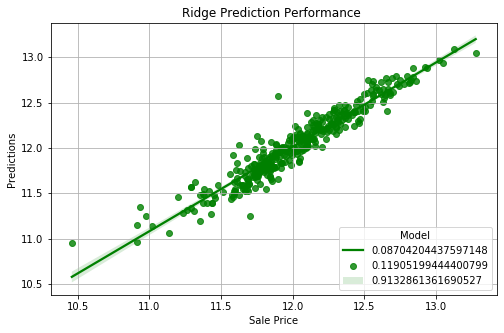

In [47]:
print('with scaled features:')
rg2 = Ridge(alpha=1, random_state=62, solver='saga')
print(cv_rmse(rg2))
rg2.fit(X2_train,y_train)
rg2_pred = rg2.predict(X2_test)
print('Ridge Regression Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, rg2_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, rg2_pred)))
print('R2_Score: ', metrics.r2_score(y_test, rg2_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,rg2_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('Ridge Prediction Performance ') 
plt.grid()
MAE = metrics.mean_absolute_error(y_test, rg2_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, rg2_pred))
R2_Score = metrics.r2_score(y_test, rg2_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()


with scaled features:
0.21687831177916855
DecisionTreeRegressor Performance:
MAE: 0.15292900819265942
RMSE: 0.016495913993845042
R2_Score:  0.7269333189482582


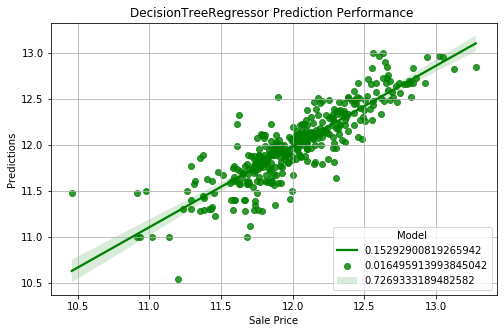

In [48]:
print('\nwith scaled features:')
dt = DecisionTreeRegressor(random_state = 62)#0.8640
print(cv_rmse(dt))
dt.fit(X2_train, y_train)
dt_pred = dt.predict(X2_test)
print('DecisionTreeRegressor Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, dt_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_log_error(y_test, dt_pred)))
print('R2_Score: ', metrics.r2_score(y_test, dt_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,dt_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('DecisionTreeRegressor Prediction Performance ')  
plt.grid()
MAE = metrics.mean_absolute_error(y_test, dt_pred)
RMSE = np.sqrt(metrics.mean_squared_log_error(y_test, dt_pred))
R2_Score = metrics.r2_score(y_test, dt_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()

In [14]:
from sklearn import tree
plt.figure(figsize=(30,25), dpi = 500)
tree.plot_tree(dt,filled=True)
plt.savefig(fname = 'dtee', dpi=500)

In [15]:
path = dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [16]:
ccp_alphas

array([0.00000000e+00, 5.21021254e-17, 5.21021254e-17, ...,
       1.45203135e-02, 1.66233150e-02, 5.72808324e-02])

In [17]:
impurities

array([9.44289488e-06, 9.44289488e-06, 9.44289488e-06, ...,
       8.24560291e-02, 9.90793441e-02, 1.56360176e-01])

In [18]:

clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeRegressor(random_state=62, ccp_alpha=ccp_alpha)
    clf.fit(X2_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.05728083235487179


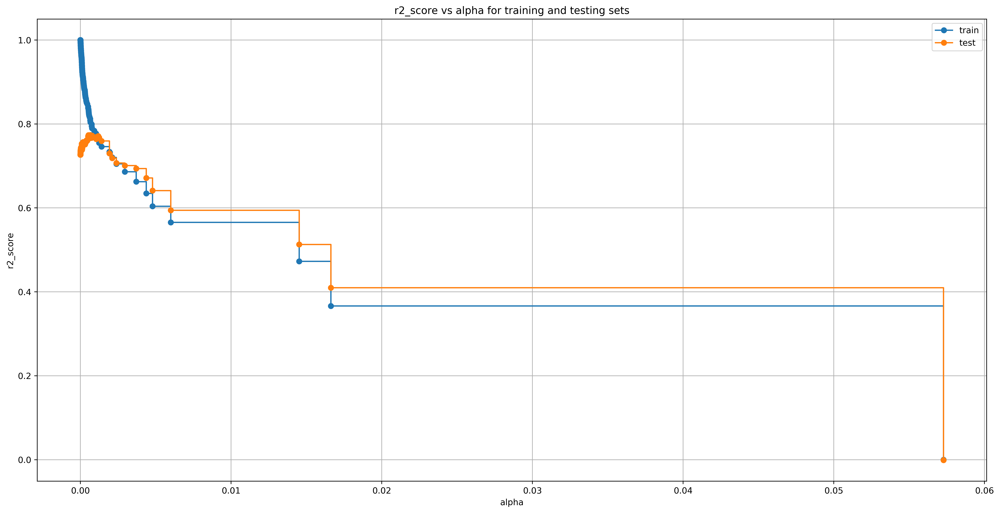

<Figure size 432x288 with 0 Axes>

In [19]:
train_scores = [metrics.r2_score(y_train, clf.predict(X2_train)) for clf in clfs]
test_scores = [metrics.r2_score(y_test, clf.predict(X2_test)) for clf in clfs]


plt.figure(figsize=(20,10), dpi = 500)
plt.xlabel("alpha")
plt.ylabel("r2_score")
plt.title("r2_score vs alpha for training and testing sets")
plt.plot(ccp_alphas, train_scores, marker='o', label="train",
        drawstyle="steps-post")
plt.plot(ccp_alphas, test_scores, marker='o', label="test",
        drawstyle="steps-post")
plt.legend()
plt.grid()
plt.show()
plt.savefig(fname = 'dtee_scores', dpi=500)

In [20]:
import plotly.express as px
import plotly.graph_objects as go
ddf = pd.DataFrame([train_scores,test_scores], index = ['ccp_alpha','r2_score'])
# Create traces
fig = go.Figure()
fig.add_trace(go.Scatter(x=ccp_alphas, y=train_scores,
                         line_shape='hvh', mode='lines+markers',
                         name='train_scores'))
fig.add_trace(go.Scatter(x=ccp_alphas, y=test_scores,line_shape='hvh',
                    mode='lines+markers',
                    name='test_scores'))

fig.update_xaxes(
        title_text = "ccp_alphas", ticks="inside", nticks=50, tick0=0.0)

fig.update_yaxes(
        title_text = "r2_score", ticks="inside", nticks=20)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)

fig.update_layout(title_text="r2_score vs alpha for training and testing sets")
fig.update_traces(hoverinfo='text+name', mode='lines+markers')


662.55e-06 is ccp_alpha


with scaled features:
0.21714518989064668
DecisionTreeRegressor Performance:
MAE: 0.14613236853807876
RMSE: 0.014893637952052131
R2_Score:  0.773539549549377


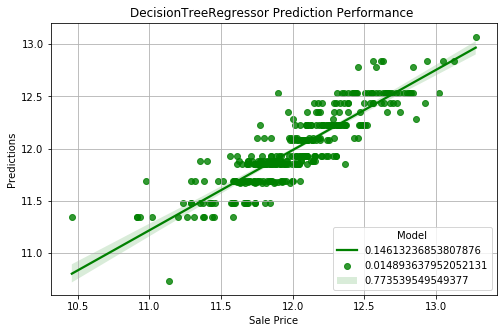

In [49]:
print('\nwith scaled features:')
dt = DecisionTreeRegressor(random_state = 62,ccp_alpha = 662.55e-06)
print(cv_rmse(dt))
dt.fit(X2_train, y_train)
dt_pred = dt.predict(X2_test)
print('DecisionTreeRegressor Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, dt_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_log_error(y_test, dt_pred)))
print('R2_Score: ', metrics.r2_score(y_test, dt_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,dt_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('DecisionTreeRegressor Prediction Performance ')  
plt.grid()
MAE = metrics.mean_absolute_error(y_test, dt_pred)
RMSE = np.sqrt(metrics.mean_squared_log_error(y_test, dt_pred))
R2_Score = metrics.r2_score(y_test, dt_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()


with scaled features:
0.18693318060309835
AdaBoostRegressor Performance:
MAE: 0.14475069304264898
RMSE: 0.18614250593722617
R2_Score:  0.7880144296782061


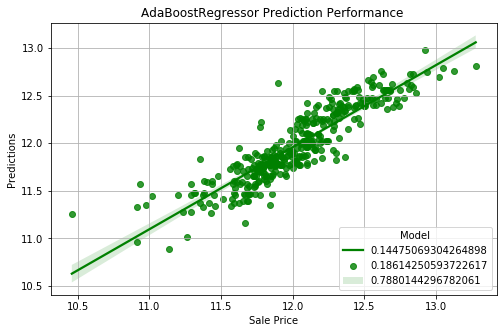

In [50]:
print('\nwith scaled features:')
ada = AdaBoostRegressor()#0.8640
print(cv_rmse(ada))
ada.fit(X2_train, y_train)
ada_pred = ada.predict(X2_test)
print('AdaBoostRegressor Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, ada_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, ada_pred)))
print('R2_Score: ', metrics.r2_score(y_test, ada_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,ada_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('AdaBoostRegressor Prediction Performance ')  
plt.grid()
MAE = metrics.mean_absolute_error(y_test, ada_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, ada_pred))
R2_Score = metrics.r2_score(y_test, ada_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()


with scaled features:
0.16369448453367363
ExtraTreesRegressor Performance:
MAE: 0.0974913189935971
RMSE: 0.14077851723387222
R2_Score:  0.8787482653090719


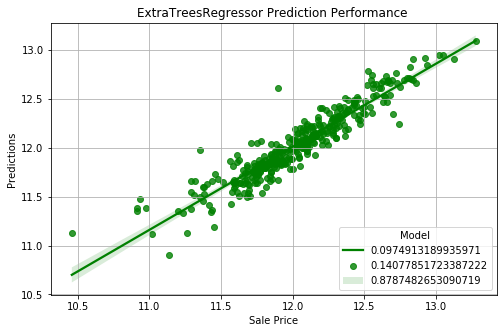

In [51]:
print('\nwith scaled features:')
ext = ExtraTreesRegressor()#0.8640
print(cv_rmse(ext))
ext.fit(X2_train, y_train)
ext_pred = ext.predict(X2_test)
print('ExtraTreesRegressor Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, ext_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, ext_pred)))
print('R2_Score: ', metrics.r2_score(y_test, ext_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,ext_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('ExtraTreesRegressor Prediction Performance ')  
plt.grid()
MAE = metrics.mean_absolute_error(y_test, ext_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, ext_pred))
R2_Score = metrics.r2_score(y_test, ext_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()


with scaled features:
0.15947690766259798
BaggingRegressor Performance:
MAE: 0.10083354467142576
RMSE: 0.14622073929328627
R2_Score:  0.8691923516445271


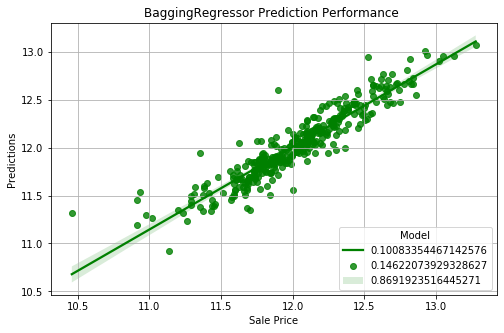

In [52]:
print('\nwith scaled features:')
bgc = BaggingRegressor()#0.8640
print(cv_rmse(bgc))
bgc.fit(X2_train, y_train)
bgc_pred = bgc.predict(X2_test)
print('BaggingRegressor Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, bgc_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, bgc_pred)))
print('R2_Score: ', metrics.r2_score(y_test, bgc_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,bgc_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('BaggingRegressor Prediction Performance ')  
plt.grid()
MAE = metrics.mean_absolute_error(y_test, bgc_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, bgc_pred))
R2_Score = metrics.r2_score(y_test, bgc_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()

with scaled features:
0.15332182052334048
RandomForestRegressor Performance:
MAE: 0.09688489432729022
RMSE: 0.14121103360004914
R2_Score:  0.8780020730341285


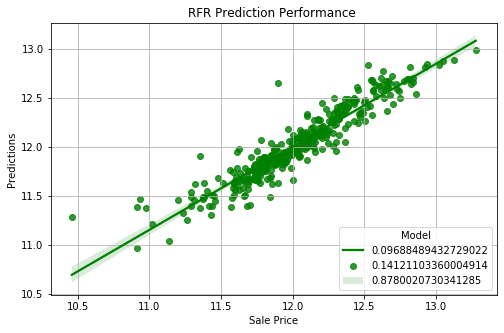

In [53]:
print('with scaled features:')
rf2 = RandomForestRegressor()#0.83080
print(cv_rmse(rf2))
rf2.fit(X2_train,y_train)
rf2_pred = rf2.predict(X2_test)
print('RandomForestRegressor Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, rf2_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, rf2_pred)))
print('R2_Score: ', metrics.r2_score(y_test, rf2_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,rf2_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('RFR Prediction Performance ') 
plt.grid()
MAE = metrics.mean_absolute_error(y_test, rf2_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, rf2_pred))
R2_Score = metrics.r2_score(y_test, rf2_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()

with scaled features:
0.13698829781992342
Gradiant Boosting Performance:
MAE: 0.08678493501210373
RMSE: 0.12282561536847206
R2_Score:  0.9077018312110698


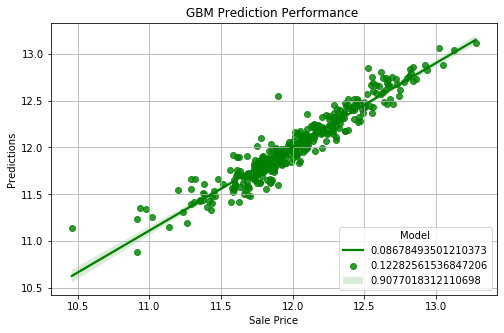

In [54]:
print('with scaled features:')
gbm2 = GradientBoostingRegressor(learning_rate=0.01, max_depth=5, max_features=7,
                          min_samples_split=20, n_estimators=1800,
                          subsample=0.7)
print(cv_rmse(gbm2))
gbm2.fit(X2_train, y_train)
gbm2_pred = gbm2.predict(X2_test)
print('Gradiant Boosting Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, gbm2_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, gbm2_pred)))
print('R2_Score: ', metrics.r2_score(y_test, gbm2_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,gbm2_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('GBM Prediction Performance ') 
plt.grid()
MAE = metrics.mean_absolute_error(y_test, gbm2_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, gbm2_pred))
R2_Score = metrics.r2_score(y_test, gbm2_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()

with scaled features:
0.1529571329637336
XGB Performance:
MAE: 0.106190346744297
RMSE: 0.15522527601426195
R2_Score:  0.8525855457983238


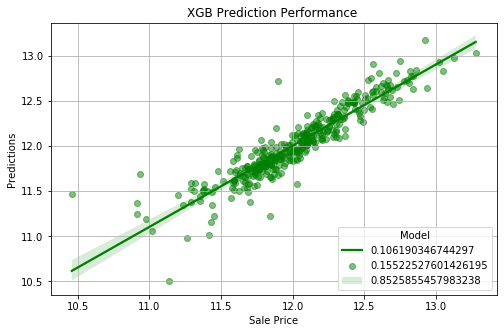

In [55]:
print('with scaled features:')
xbgr2 = xgb.XGBRegressor(n_estimators=300)
print(cv_rmse(xbgr2))
xbgr2.fit(X2_train,y_train)
xbgr2_pred = xbgr2.predict(X2_test)
print('XGB Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, xbgr2_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, xbgr2_pred)))
print('R2_Score: ', metrics.r2_score(y_test, xbgr2_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,xbgr2_pred,color='g',scatter_kws={'alpha':0.5})
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('XGB Prediction Performance ')  
plt.grid()
MAE = metrics.mean_absolute_error(y_test, xbgr2_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, xbgr2_pred))
R2_Score = metrics.r2_score(y_test, xbgr2_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()


with scaled features:
0.14372848877774058
LGBMRegressor Performance:
MAE: 0.09502387880727066
RMSE: 0.13254945654159933
R2_Score:  0.8925092507250637


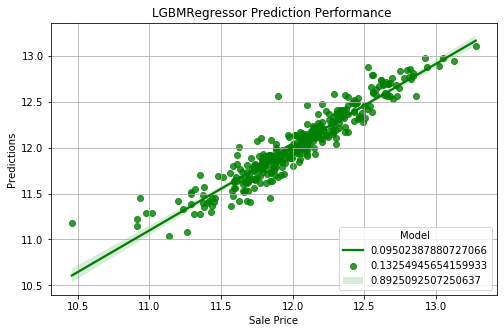

In [56]:
print('\nwith scaled features:')
lgbr2 = lgb.LGBMRegressor()
print(cv_rmse(lgbr2))
lgbr2.fit(X2_train, y_train)
lgbr2_pred = lgbr2.predict(X2_test)
print('LGBMRegressor Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, lgbr2_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, lgbr2_pred)))
print('R2_Score: ', metrics.r2_score(y_test, lgbr2_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,lgbr2_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('LGBMRegressor Prediction Performance ')  
plt.grid()
MAE = metrics.mean_absolute_error(y_test, lgbr2_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, lgbr2_pred))
R2_Score = metrics.r2_score(y_test, lgbr2_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()


with scaled features:
Learning rate set to 0.03964
0:	learn: 0.3857125	total: 5.06ms	remaining: 5.06s
1:	learn: 0.3762455	total: 10.3ms	remaining: 5.15s
2:	learn: 0.3671176	total: 15.6ms	remaining: 5.18s
3:	learn: 0.3585453	total: 20.6ms	remaining: 5.13s
4:	learn: 0.3494301	total: 25.5ms	remaining: 5.08s
5:	learn: 0.3409562	total: 30.5ms	remaining: 5.05s
6:	learn: 0.3325810	total: 35.4ms	remaining: 5.03s
7:	learn: 0.3250429	total: 40.4ms	remaining: 5s
8:	learn: 0.3175198	total: 45.2ms	remaining: 4.97s
9:	learn: 0.3104862	total: 50ms	remaining: 4.95s
10:	learn: 0.3035357	total: 54.9ms	remaining: 4.93s
11:	learn: 0.2969676	total: 59.6ms	remaining: 4.91s
12:	learn: 0.2907194	total: 64.4ms	remaining: 4.89s
13:	learn: 0.2849199	total: 69.2ms	remaining: 4.87s
14:	learn: 0.2794186	total: 82.6ms	remaining: 5.43s
15:	learn: 0.2739362	total: 88.4ms	remaining: 5.44s
16:	learn: 0.2686339	total: 94.3ms	remaining: 5.45s
17:	learn: 0.2635332	total: 101ms	remaining: 5.49s
18:	learn: 0.2594114	total: 

171:	learn: 0.1136586	total: 928ms	remaining: 4.47s
172:	learn: 0.1135439	total: 934ms	remaining: 4.46s
173:	learn: 0.1135025	total: 940ms	remaining: 4.46s
174:	learn: 0.1134132	total: 945ms	remaining: 4.46s
175:	learn: 0.1133823	total: 951ms	remaining: 4.45s
176:	learn: 0.1132769	total: 957ms	remaining: 4.45s
177:	learn: 0.1131827	total: 964ms	remaining: 4.45s
178:	learn: 0.1130458	total: 970ms	remaining: 4.45s
179:	learn: 0.1128400	total: 975ms	remaining: 4.44s
180:	learn: 0.1126321	total: 981ms	remaining: 4.44s
181:	learn: 0.1124843	total: 986ms	remaining: 4.43s
182:	learn: 0.1121541	total: 992ms	remaining: 4.43s
183:	learn: 0.1120357	total: 998ms	remaining: 4.42s
184:	learn: 0.1119026	total: 1s	remaining: 4.42s
185:	learn: 0.1117601	total: 1.01s	remaining: 4.42s
186:	learn: 0.1116023	total: 1.01s	remaining: 4.41s
187:	learn: 0.1114550	total: 1.02s	remaining: 4.42s
188:	learn: 0.1112897	total: 1.03s	remaining: 4.41s
189:	learn: 0.1111548	total: 1.03s	remaining: 4.41s
190:	learn: 0.1

362:	learn: 0.0894050	total: 1.97s	remaining: 3.46s
363:	learn: 0.0892767	total: 1.98s	remaining: 3.45s
364:	learn: 0.0890779	total: 1.98s	remaining: 3.45s
365:	learn: 0.0889220	total: 1.99s	remaining: 3.44s
366:	learn: 0.0888999	total: 1.99s	remaining: 3.44s
367:	learn: 0.0887864	total: 2s	remaining: 3.44s
368:	learn: 0.0886323	total: 2s	remaining: 3.43s
369:	learn: 0.0885879	total: 2.01s	remaining: 3.42s
370:	learn: 0.0885519	total: 2.02s	remaining: 3.42s
371:	learn: 0.0884335	total: 2.02s	remaining: 3.41s
372:	learn: 0.0883254	total: 2.03s	remaining: 3.41s
373:	learn: 0.0881908	total: 2.03s	remaining: 3.4s
374:	learn: 0.0880631	total: 2.04s	remaining: 3.39s
375:	learn: 0.0878887	total: 2.04s	remaining: 3.39s
376:	learn: 0.0878412	total: 2.04s	remaining: 3.38s
377:	learn: 0.0877274	total: 2.05s	remaining: 3.37s
378:	learn: 0.0875884	total: 2.06s	remaining: 3.37s
379:	learn: 0.0875268	total: 2.06s	remaining: 3.36s
380:	learn: 0.0874804	total: 2.07s	remaining: 3.36s
381:	learn: 0.08743

529:	learn: 0.0762382	total: 2.84s	remaining: 2.52s
530:	learn: 0.0761322	total: 2.85s	remaining: 2.51s
531:	learn: 0.0761242	total: 2.85s	remaining: 2.51s
532:	learn: 0.0761177	total: 2.86s	remaining: 2.51s
533:	learn: 0.0760087	total: 2.87s	remaining: 2.5s
534:	learn: 0.0759210	total: 2.87s	remaining: 2.5s
535:	learn: 0.0758148	total: 2.88s	remaining: 2.49s
536:	learn: 0.0757237	total: 2.88s	remaining: 2.49s
537:	learn: 0.0756245	total: 2.89s	remaining: 2.48s
538:	learn: 0.0755678	total: 2.89s	remaining: 2.48s
539:	learn: 0.0754666	total: 2.9s	remaining: 2.47s
540:	learn: 0.0754388	total: 2.9s	remaining: 2.46s
541:	learn: 0.0753443	total: 2.91s	remaining: 2.46s
542:	learn: 0.0752863	total: 2.91s	remaining: 2.45s
543:	learn: 0.0752064	total: 2.92s	remaining: 2.45s
544:	learn: 0.0752001	total: 2.92s	remaining: 2.44s
545:	learn: 0.0751160	total: 2.93s	remaining: 2.43s
546:	learn: 0.0751078	total: 2.93s	remaining: 2.43s
547:	learn: 0.0749781	total: 2.94s	remaining: 2.42s
548:	learn: 0.07

692:	learn: 0.0663165	total: 3.7s	remaining: 1.64s
693:	learn: 0.0662891	total: 3.71s	remaining: 1.63s
694:	learn: 0.0661983	total: 3.72s	remaining: 1.63s
695:	learn: 0.0661731	total: 3.73s	remaining: 1.63s
696:	learn: 0.0661003	total: 3.74s	remaining: 1.63s
697:	learn: 0.0660858	total: 3.75s	remaining: 1.62s
698:	learn: 0.0659908	total: 3.76s	remaining: 1.62s
699:	learn: 0.0658832	total: 3.77s	remaining: 1.61s
700:	learn: 0.0658351	total: 3.77s	remaining: 1.61s
701:	learn: 0.0658075	total: 3.78s	remaining: 1.6s
702:	learn: 0.0657922	total: 3.79s	remaining: 1.6s
703:	learn: 0.0657778	total: 3.79s	remaining: 1.59s
704:	learn: 0.0656828	total: 3.8s	remaining: 1.59s
705:	learn: 0.0655836	total: 3.81s	remaining: 1.58s
706:	learn: 0.0655793	total: 3.81s	remaining: 1.58s
707:	learn: 0.0655056	total: 3.82s	remaining: 1.57s
708:	learn: 0.0653865	total: 3.82s	remaining: 1.57s
709:	learn: 0.0653460	total: 3.83s	remaining: 1.56s
710:	learn: 0.0653344	total: 3.83s	remaining: 1.56s
711:	learn: 0.06

857:	learn: 0.0586165	total: 4.71s	remaining: 780ms
858:	learn: 0.0585915	total: 4.72s	remaining: 775ms
859:	learn: 0.0585661	total: 4.72s	remaining: 769ms
860:	learn: 0.0585486	total: 4.73s	remaining: 764ms
861:	learn: 0.0585116	total: 4.74s	remaining: 758ms
862:	learn: 0.0584691	total: 4.74s	remaining: 753ms
863:	learn: 0.0584184	total: 4.75s	remaining: 748ms
864:	learn: 0.0583678	total: 4.75s	remaining: 742ms
865:	learn: 0.0583576	total: 4.76s	remaining: 737ms
866:	learn: 0.0582494	total: 4.77s	remaining: 731ms
867:	learn: 0.0582261	total: 4.77s	remaining: 726ms
868:	learn: 0.0581964	total: 4.78s	remaining: 720ms
869:	learn: 0.0581611	total: 4.78s	remaining: 715ms
870:	learn: 0.0581521	total: 4.79s	remaining: 709ms
871:	learn: 0.0581106	total: 4.79s	remaining: 704ms
872:	learn: 0.0580702	total: 4.8s	remaining: 698ms
873:	learn: 0.0580648	total: 4.8s	remaining: 692ms
874:	learn: 0.0580175	total: 4.81s	remaining: 687ms
875:	learn: 0.0579901	total: 4.81s	remaining: 681ms
876:	learn: 0.

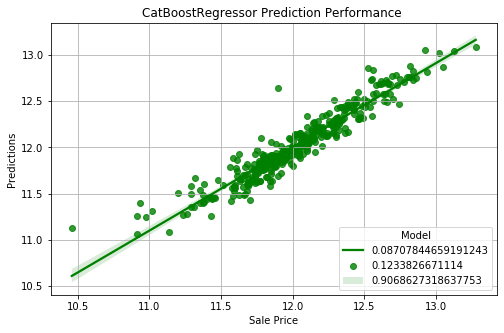

In [57]:
print('\nwith scaled features:')
cbr2 = cb.CatBoostRegressor()#0.87452
cbr2.fit(X2_train, y_train)
cbr2_pred = cbr2.predict(X2_test)
print('CatBoostRegressor Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, cbr2_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, cbr2_pred)))
print('R2_Score: ', metrics.r2_score(y_test, cbr2_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,cbr2_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('CatBoostRegressor Prediction Performance ')  
plt.grid()
MAE = metrics.mean_absolute_error(y_test, cbr2_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, cbr2_pred))
R2_Score = metrics.r2_score(y_test, cbr2_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()

In [58]:
print(cv_rmse(cbr2))

Learning rate set to 0.03809
0:	learn: 0.3868225	total: 10.2ms	remaining: 10.1s
1:	learn: 0.3777465	total: 16.4ms	remaining: 8.17s
2:	learn: 0.3688573	total: 22.6ms	remaining: 7.52s
3:	learn: 0.3605840	total: 28.2ms	remaining: 7.03s
4:	learn: 0.3524592	total: 34.1ms	remaining: 6.78s
5:	learn: 0.3449121	total: 38.5ms	remaining: 6.38s
6:	learn: 0.3370441	total: 43ms	remaining: 6.09s
7:	learn: 0.3296636	total: 47.4ms	remaining: 5.88s
8:	learn: 0.3231594	total: 53.6ms	remaining: 5.9s
9:	learn: 0.3172162	total: 58ms	remaining: 5.75s
10:	learn: 0.3115719	total: 62.7ms	remaining: 5.64s
11:	learn: 0.3063364	total: 67.2ms	remaining: 5.53s
12:	learn: 0.3007539	total: 71.7ms	remaining: 5.44s
13:	learn: 0.2948886	total: 76.3ms	remaining: 5.38s
14:	learn: 0.2891532	total: 80.8ms	remaining: 5.31s
15:	learn: 0.2839885	total: 85.3ms	remaining: 5.24s
16:	learn: 0.2785454	total: 89.8ms	remaining: 5.19s
17:	learn: 0.2732440	total: 94.2ms	remaining: 5.14s
18:	learn: 0.2688405	total: 98.8ms	remaining: 5.1s

186:	learn: 0.1156629	total: 1.02s	remaining: 4.46s
187:	learn: 0.1155655	total: 1.03s	remaining: 4.45s
188:	learn: 0.1153945	total: 1.04s	remaining: 4.45s
189:	learn: 0.1153168	total: 1.04s	remaining: 4.44s
190:	learn: 0.1151578	total: 1.05s	remaining: 4.43s
191:	learn: 0.1149349	total: 1.05s	remaining: 4.43s
192:	learn: 0.1147424	total: 1.06s	remaining: 4.42s
193:	learn: 0.1145652	total: 1.06s	remaining: 4.42s
194:	learn: 0.1144017	total: 1.07s	remaining: 4.41s
195:	learn: 0.1141918	total: 1.07s	remaining: 4.4s
196:	learn: 0.1138307	total: 1.08s	remaining: 4.39s
197:	learn: 0.1136713	total: 1.08s	remaining: 4.38s
198:	learn: 0.1133971	total: 1.08s	remaining: 4.37s
199:	learn: 0.1131799	total: 1.09s	remaining: 4.36s
200:	learn: 0.1129773	total: 1.09s	remaining: 4.35s
201:	learn: 0.1128988	total: 1.1s	remaining: 4.34s
202:	learn: 0.1128431	total: 1.1s	remaining: 4.33s
203:	learn: 0.1127008	total: 1.11s	remaining: 4.32s
204:	learn: 0.1126407	total: 1.11s	remaining: 4.31s
205:	learn: 0.1

364:	learn: 0.0910249	total: 1.88s	remaining: 3.27s
365:	learn: 0.0909548	total: 1.89s	remaining: 3.27s
366:	learn: 0.0909348	total: 1.89s	remaining: 3.27s
367:	learn: 0.0908157	total: 1.9s	remaining: 3.26s
368:	learn: 0.0907508	total: 1.9s	remaining: 3.26s
369:	learn: 0.0905588	total: 1.91s	remaining: 3.25s
370:	learn: 0.0905428	total: 1.92s	remaining: 3.25s
371:	learn: 0.0903974	total: 1.92s	remaining: 3.24s
372:	learn: 0.0903824	total: 1.93s	remaining: 3.24s
373:	learn: 0.0902683	total: 1.93s	remaining: 3.23s
374:	learn: 0.0900992	total: 1.93s	remaining: 3.22s
375:	learn: 0.0899382	total: 1.94s	remaining: 3.22s
376:	learn: 0.0898670	total: 1.94s	remaining: 3.21s
377:	learn: 0.0897205	total: 1.95s	remaining: 3.21s
378:	learn: 0.0896587	total: 1.95s	remaining: 3.2s
379:	learn: 0.0895818	total: 1.96s	remaining: 3.19s
380:	learn: 0.0895605	total: 1.96s	remaining: 3.19s
381:	learn: 0.0893405	total: 1.97s	remaining: 3.18s
382:	learn: 0.0893246	total: 1.97s	remaining: 3.17s
383:	learn: 0.0

543:	learn: 0.0752717	total: 2.76s	remaining: 2.31s
544:	learn: 0.0751789	total: 2.76s	remaining: 2.31s
545:	learn: 0.0750699	total: 2.77s	remaining: 2.3s
546:	learn: 0.0749381	total: 2.77s	remaining: 2.3s
547:	learn: 0.0748285	total: 2.78s	remaining: 2.29s
548:	learn: 0.0748023	total: 2.78s	remaining: 2.29s
549:	learn: 0.0747800	total: 2.79s	remaining: 2.28s
550:	learn: 0.0747698	total: 2.79s	remaining: 2.28s
551:	learn: 0.0746768	total: 2.8s	remaining: 2.27s
552:	learn: 0.0746678	total: 2.8s	remaining: 2.27s
553:	learn: 0.0745857	total: 2.81s	remaining: 2.26s
554:	learn: 0.0744312	total: 2.81s	remaining: 2.25s
555:	learn: 0.0744238	total: 2.82s	remaining: 2.25s
556:	learn: 0.0744146	total: 2.82s	remaining: 2.24s
557:	learn: 0.0742632	total: 2.83s	remaining: 2.24s
558:	learn: 0.0742263	total: 2.83s	remaining: 2.23s
559:	learn: 0.0740908	total: 2.83s	remaining: 2.23s
560:	learn: 0.0739761	total: 2.84s	remaining: 2.22s
561:	learn: 0.0739377	total: 2.84s	remaining: 2.22s
562:	learn: 0.07

724:	learn: 0.0636208	total: 3.6s	remaining: 1.37s
725:	learn: 0.0636159	total: 3.61s	remaining: 1.36s
726:	learn: 0.0636092	total: 3.61s	remaining: 1.36s
727:	learn: 0.0635331	total: 3.62s	remaining: 1.35s
728:	learn: 0.0634435	total: 3.62s	remaining: 1.35s
729:	learn: 0.0633526	total: 3.63s	remaining: 1.34s
730:	learn: 0.0632770	total: 3.63s	remaining: 1.34s
731:	learn: 0.0632331	total: 3.64s	remaining: 1.33s
732:	learn: 0.0631398	total: 3.65s	remaining: 1.33s
733:	learn: 0.0630864	total: 3.65s	remaining: 1.32s
734:	learn: 0.0629925	total: 3.65s	remaining: 1.32s
735:	learn: 0.0629870	total: 3.66s	remaining: 1.31s
736:	learn: 0.0628618	total: 3.66s	remaining: 1.31s
737:	learn: 0.0628344	total: 3.67s	remaining: 1.3s
738:	learn: 0.0628301	total: 3.67s	remaining: 1.3s
739:	learn: 0.0627444	total: 3.68s	remaining: 1.29s
740:	learn: 0.0626994	total: 3.68s	remaining: 1.29s
741:	learn: 0.0625920	total: 3.69s	remaining: 1.28s
742:	learn: 0.0624959	total: 3.69s	remaining: 1.28s
743:	learn: 0.0

906:	learn: 0.0544021	total: 4.46s	remaining: 458ms
907:	learn: 0.0543989	total: 4.47s	remaining: 453ms
908:	learn: 0.0543715	total: 4.48s	remaining: 448ms
909:	learn: 0.0542970	total: 4.49s	remaining: 444ms
910:	learn: 0.0542940	total: 4.49s	remaining: 439ms
911:	learn: 0.0542900	total: 4.5s	remaining: 434ms
912:	learn: 0.0542400	total: 4.5s	remaining: 429ms
913:	learn: 0.0542316	total: 4.51s	remaining: 424ms
914:	learn: 0.0542097	total: 4.51s	remaining: 419ms
915:	learn: 0.0541659	total: 4.52s	remaining: 414ms
916:	learn: 0.0541627	total: 4.52s	remaining: 410ms
917:	learn: 0.0541053	total: 4.53s	remaining: 405ms
918:	learn: 0.0540385	total: 4.53s	remaining: 400ms
919:	learn: 0.0540188	total: 4.54s	remaining: 395ms
920:	learn: 0.0539495	total: 4.54s	remaining: 390ms
921:	learn: 0.0538952	total: 4.55s	remaining: 385ms
922:	learn: 0.0538336	total: 4.55s	remaining: 380ms
923:	learn: 0.0538134	total: 4.56s	remaining: 375ms
924:	learn: 0.0537519	total: 4.56s	remaining: 370ms
925:	learn: 0.

69:	learn: 0.1494972	total: 337ms	remaining: 4.48s
70:	learn: 0.1485483	total: 343ms	remaining: 4.49s
71:	learn: 0.1477804	total: 349ms	remaining: 4.49s
72:	learn: 0.1467826	total: 354ms	remaining: 4.5s
73:	learn: 0.1458478	total: 361ms	remaining: 4.52s
74:	learn: 0.1450271	total: 367ms	remaining: 4.52s
75:	learn: 0.1442351	total: 372ms	remaining: 4.52s
76:	learn: 0.1434966	total: 378ms	remaining: 4.53s
77:	learn: 0.1426899	total: 384ms	remaining: 4.54s
78:	learn: 0.1419608	total: 390ms	remaining: 4.54s
79:	learn: 0.1411221	total: 394ms	remaining: 4.54s
80:	learn: 0.1402824	total: 399ms	remaining: 4.53s
81:	learn: 0.1395048	total: 404ms	remaining: 4.52s
82:	learn: 0.1388979	total: 409ms	remaining: 4.51s
83:	learn: 0.1383464	total: 413ms	remaining: 4.5s
84:	learn: 0.1377206	total: 417ms	remaining: 4.49s
85:	learn: 0.1372934	total: 422ms	remaining: 4.48s
86:	learn: 0.1367256	total: 426ms	remaining: 4.47s
87:	learn: 0.1361438	total: 431ms	remaining: 4.46s
88:	learn: 0.1356306	total: 435ms

229:	learn: 0.1030256	total: 1.2s	remaining: 4.03s
230:	learn: 0.1028818	total: 1.21s	remaining: 4.02s
231:	learn: 0.1027693	total: 1.21s	remaining: 4.02s
232:	learn: 0.1027175	total: 1.22s	remaining: 4.02s
233:	learn: 0.1024805	total: 1.23s	remaining: 4.01s
234:	learn: 0.1024247	total: 1.23s	remaining: 4.01s
235:	learn: 0.1023483	total: 1.24s	remaining: 4s
236:	learn: 0.1022873	total: 1.24s	remaining: 4s
237:	learn: 0.1022438	total: 1.25s	remaining: 4s
238:	learn: 0.1020905	total: 1.25s	remaining: 4s
239:	learn: 0.1019899	total: 1.26s	remaining: 3.99s
240:	learn: 0.1019088	total: 1.26s	remaining: 3.99s
241:	learn: 0.1018539	total: 1.27s	remaining: 3.98s
242:	learn: 0.1018074	total: 1.28s	remaining: 3.98s
243:	learn: 0.1017516	total: 1.28s	remaining: 3.97s
244:	learn: 0.1016966	total: 1.29s	remaining: 3.97s
245:	learn: 0.1016641	total: 1.29s	remaining: 3.96s
246:	learn: 0.1015990	total: 1.3s	remaining: 3.96s
247:	learn: 0.1013721	total: 1.3s	remaining: 3.95s
248:	learn: 0.1013442	total

408:	learn: 0.0813088	total: 2.06s	remaining: 2.97s
409:	learn: 0.0811728	total: 2.06s	remaining: 2.97s
410:	learn: 0.0811533	total: 2.07s	remaining: 2.96s
411:	learn: 0.0810460	total: 2.07s	remaining: 2.96s
412:	learn: 0.0810012	total: 2.08s	remaining: 2.95s
413:	learn: 0.0809137	total: 2.08s	remaining: 2.95s
414:	learn: 0.0808229	total: 2.09s	remaining: 2.95s
415:	learn: 0.0806732	total: 2.09s	remaining: 2.94s
416:	learn: 0.0805545	total: 2.1s	remaining: 2.93s
417:	learn: 0.0805083	total: 2.1s	remaining: 2.93s
418:	learn: 0.0804867	total: 2.11s	remaining: 2.92s
419:	learn: 0.0804182	total: 2.11s	remaining: 2.92s
420:	learn: 0.0803046	total: 2.12s	remaining: 2.91s
421:	learn: 0.0801468	total: 2.12s	remaining: 2.9s
422:	learn: 0.0800590	total: 2.13s	remaining: 2.9s
423:	learn: 0.0799547	total: 2.13s	remaining: 2.89s
424:	learn: 0.0798419	total: 2.13s	remaining: 2.89s
425:	learn: 0.0797976	total: 2.14s	remaining: 2.88s
426:	learn: 0.0796809	total: 2.14s	remaining: 2.88s
427:	learn: 0.07

586:	learn: 0.0661872	total: 2.9s	remaining: 2.04s
587:	learn: 0.0660360	total: 2.9s	remaining: 2.03s
588:	learn: 0.0659788	total: 2.91s	remaining: 2.03s
589:	learn: 0.0659028	total: 2.91s	remaining: 2.02s
590:	learn: 0.0658875	total: 2.92s	remaining: 2.02s
591:	learn: 0.0657394	total: 2.92s	remaining: 2.02s
592:	learn: 0.0657039	total: 2.93s	remaining: 2.01s
593:	learn: 0.0655826	total: 2.94s	remaining: 2.01s
594:	learn: 0.0654917	total: 2.94s	remaining: 2s
595:	learn: 0.0654655	total: 2.94s	remaining: 2s
596:	learn: 0.0653990	total: 2.95s	remaining: 1.99s
597:	learn: 0.0653514	total: 2.95s	remaining: 1.99s
598:	learn: 0.0653260	total: 2.96s	remaining: 1.98s
599:	learn: 0.0653098	total: 2.96s	remaining: 1.97s
600:	learn: 0.0652250	total: 2.97s	remaining: 1.97s
601:	learn: 0.0651274	total: 2.97s	remaining: 1.96s
602:	learn: 0.0650620	total: 2.98s	remaining: 1.96s
603:	learn: 0.0649171	total: 2.98s	remaining: 1.95s
604:	learn: 0.0648380	total: 2.98s	remaining: 1.95s
605:	learn: 0.064777

768:	learn: 0.0557549	total: 3.75s	remaining: 1.13s
769:	learn: 0.0556524	total: 3.76s	remaining: 1.12s
770:	learn: 0.0556476	total: 3.77s	remaining: 1.12s
771:	learn: 0.0555523	total: 3.77s	remaining: 1.11s
772:	learn: 0.0555040	total: 3.78s	remaining: 1.11s
773:	learn: 0.0554823	total: 3.78s	remaining: 1.1s
774:	learn: 0.0554189	total: 3.79s	remaining: 1.1s
775:	learn: 0.0553632	total: 3.79s	remaining: 1.09s
776:	learn: 0.0553055	total: 3.8s	remaining: 1.09s
777:	learn: 0.0552708	total: 3.8s	remaining: 1.08s
778:	learn: 0.0552118	total: 3.81s	remaining: 1.08s
779:	learn: 0.0551600	total: 3.81s	remaining: 1.07s
780:	learn: 0.0551223	total: 3.81s	remaining: 1.07s
781:	learn: 0.0550604	total: 3.82s	remaining: 1.06s
782:	learn: 0.0550012	total: 3.83s	remaining: 1.06s
783:	learn: 0.0549062	total: 3.83s	remaining: 1.06s
784:	learn: 0.0548161	total: 3.84s	remaining: 1.05s
785:	learn: 0.0547672	total: 3.84s	remaining: 1.05s
786:	learn: 0.0547109	total: 3.85s	remaining: 1.04s
787:	learn: 0.05

949:	learn: 0.0475524	total: 4.61s	remaining: 243ms
950:	learn: 0.0475375	total: 4.62s	remaining: 238ms
951:	learn: 0.0475306	total: 4.63s	remaining: 233ms
952:	learn: 0.0474399	total: 4.63s	remaining: 228ms
953:	learn: 0.0473935	total: 4.64s	remaining: 224ms
954:	learn: 0.0473087	total: 4.64s	remaining: 219ms
955:	learn: 0.0472663	total: 4.65s	remaining: 214ms
956:	learn: 0.0472579	total: 4.65s	remaining: 209ms
957:	learn: 0.0471862	total: 4.66s	remaining: 204ms
958:	learn: 0.0471517	total: 4.66s	remaining: 199ms
959:	learn: 0.0470814	total: 4.67s	remaining: 194ms
960:	learn: 0.0469974	total: 4.67s	remaining: 190ms
961:	learn: 0.0469926	total: 4.68s	remaining: 185ms
962:	learn: 0.0469399	total: 4.68s	remaining: 180ms
963:	learn: 0.0469083	total: 4.68s	remaining: 175ms
964:	learn: 0.0468549	total: 4.69s	remaining: 170ms
965:	learn: 0.0468158	total: 4.69s	remaining: 165ms
966:	learn: 0.0467639	total: 4.7s	remaining: 160ms
967:	learn: 0.0467067	total: 4.7s	remaining: 155ms
968:	learn: 0.

128:	learn: 0.1203179	total: 757ms	remaining: 5.11s
129:	learn: 0.1200914	total: 765ms	remaining: 5.12s
130:	learn: 0.1198285	total: 771ms	remaining: 5.12s
131:	learn: 0.1195663	total: 779ms	remaining: 5.12s
132:	learn: 0.1193028	total: 787ms	remaining: 5.13s
133:	learn: 0.1190399	total: 792ms	remaining: 5.12s
134:	learn: 0.1187094	total: 799ms	remaining: 5.12s
135:	learn: 0.1184146	total: 806ms	remaining: 5.12s
136:	learn: 0.1180840	total: 812ms	remaining: 5.12s
137:	learn: 0.1178146	total: 818ms	remaining: 5.11s
138:	learn: 0.1175371	total: 825ms	remaining: 5.11s
139:	learn: 0.1171487	total: 831ms	remaining: 5.11s
140:	learn: 0.1169156	total: 838ms	remaining: 5.1s
141:	learn: 0.1166021	total: 844ms	remaining: 5.1s
142:	learn: 0.1163858	total: 850ms	remaining: 5.09s
143:	learn: 0.1161473	total: 855ms	remaining: 5.08s
144:	learn: 0.1158495	total: 861ms	remaining: 5.08s
145:	learn: 0.1156055	total: 867ms	remaining: 5.07s
146:	learn: 0.1153238	total: 873ms	remaining: 5.07s
147:	learn: 0.

312:	learn: 0.0888172	total: 1.8s	remaining: 3.94s
313:	learn: 0.0887168	total: 1.84s	remaining: 4.03s
314:	learn: 0.0886697	total: 1.86s	remaining: 4.04s
315:	learn: 0.0885453	total: 1.9s	remaining: 4.11s
316:	learn: 0.0885117	total: 1.91s	remaining: 4.12s
317:	learn: 0.0884831	total: 1.92s	remaining: 4.12s
318:	learn: 0.0884553	total: 1.93s	remaining: 4.12s
319:	learn: 0.0883286	total: 1.94s	remaining: 4.12s
320:	learn: 0.0882271	total: 1.95s	remaining: 4.13s
321:	learn: 0.0880678	total: 1.97s	remaining: 4.15s
322:	learn: 0.0880045	total: 1.98s	remaining: 4.15s
323:	learn: 0.0878547	total: 1.99s	remaining: 4.15s
324:	learn: 0.0876971	total: 2s	remaining: 4.16s
325:	learn: 0.0875383	total: 2.01s	remaining: 4.15s
326:	learn: 0.0874183	total: 2.01s	remaining: 4.14s
327:	learn: 0.0873592	total: 2.02s	remaining: 4.14s
328:	learn: 0.0872176	total: 2.03s	remaining: 4.13s
329:	learn: 0.0870909	total: 2.03s	remaining: 4.13s
330:	learn: 0.0869445	total: 2.05s	remaining: 4.14s
331:	learn: 0.086

487:	learn: 0.0725133	total: 2.98s	remaining: 3.13s
488:	learn: 0.0725032	total: 2.99s	remaining: 3.12s
489:	learn: 0.0724559	total: 3s	remaining: 3.12s
490:	learn: 0.0723074	total: 3s	remaining: 3.11s
491:	learn: 0.0722166	total: 3.01s	remaining: 3.1s
492:	learn: 0.0721598	total: 3.01s	remaining: 3.1s
493:	learn: 0.0720952	total: 3.02s	remaining: 3.09s
494:	learn: 0.0719840	total: 3.02s	remaining: 3.08s
495:	learn: 0.0719035	total: 3.03s	remaining: 3.08s
496:	learn: 0.0718774	total: 3.03s	remaining: 3.07s
497:	learn: 0.0717350	total: 3.04s	remaining: 3.06s
498:	learn: 0.0716340	total: 3.04s	remaining: 3.05s
499:	learn: 0.0714894	total: 3.05s	remaining: 3.05s
500:	learn: 0.0714100	total: 3.05s	remaining: 3.04s
501:	learn: 0.0713645	total: 3.06s	remaining: 3.03s
502:	learn: 0.0712963	total: 3.06s	remaining: 3.02s
503:	learn: 0.0712371	total: 3.06s	remaining: 3.02s
504:	learn: 0.0711426	total: 3.07s	remaining: 3.01s
505:	learn: 0.0711052	total: 3.08s	remaining: 3s
506:	learn: 0.0710512	t

651:	learn: 0.0610781	total: 3.86s	remaining: 2.06s
652:	learn: 0.0609882	total: 3.87s	remaining: 2.06s
653:	learn: 0.0609480	total: 3.88s	remaining: 2.05s
654:	learn: 0.0609287	total: 3.89s	remaining: 2.05s
655:	learn: 0.0608533	total: 3.89s	remaining: 2.04s
656:	learn: 0.0607394	total: 3.9s	remaining: 2.04s
657:	learn: 0.0606950	total: 3.9s	remaining: 2.03s
658:	learn: 0.0606679	total: 3.91s	remaining: 2.02s
659:	learn: 0.0605714	total: 3.92s	remaining: 2.02s
660:	learn: 0.0605092	total: 3.92s	remaining: 2.01s
661:	learn: 0.0604429	total: 3.93s	remaining: 2.01s
662:	learn: 0.0603891	total: 3.94s	remaining: 2s
663:	learn: 0.0603806	total: 3.94s	remaining: 1.99s
664:	learn: 0.0603121	total: 3.95s	remaining: 1.99s
665:	learn: 0.0603033	total: 3.95s	remaining: 1.98s
666:	learn: 0.0602279	total: 3.96s	remaining: 1.98s
667:	learn: 0.0602098	total: 3.96s	remaining: 1.97s
668:	learn: 0.0601920	total: 3.97s	remaining: 1.96s
669:	learn: 0.0601213	total: 3.98s	remaining: 1.96s
670:	learn: 0.060

812:	learn: 0.0528723	total: 4.72s	remaining: 1.09s
813:	learn: 0.0528220	total: 4.73s	remaining: 1.08s
814:	learn: 0.0528135	total: 4.74s	remaining: 1.07s
815:	learn: 0.0527525	total: 4.74s	remaining: 1.07s
816:	learn: 0.0526969	total: 4.75s	remaining: 1.06s
817:	learn: 0.0526348	total: 4.75s	remaining: 1.06s
818:	learn: 0.0525764	total: 4.76s	remaining: 1.05s
819:	learn: 0.0525678	total: 4.76s	remaining: 1.04s
820:	learn: 0.0524981	total: 4.77s	remaining: 1.04s
821:	learn: 0.0524473	total: 4.77s	remaining: 1.03s
822:	learn: 0.0523979	total: 4.78s	remaining: 1.03s
823:	learn: 0.0523450	total: 4.78s	remaining: 1.02s
824:	learn: 0.0522703	total: 4.79s	remaining: 1.01s
825:	learn: 0.0522269	total: 4.79s	remaining: 1.01s
826:	learn: 0.0521755	total: 4.8s	remaining: 1s
827:	learn: 0.0521525	total: 4.8s	remaining: 998ms
828:	learn: 0.0521203	total: 4.81s	remaining: 992ms
829:	learn: 0.0520491	total: 4.81s	remaining: 986ms
830:	learn: 0.0520299	total: 4.82s	remaining: 979ms
831:	learn: 0.051

983:	learn: 0.0458591	total: 5.59s	remaining: 90.9ms
984:	learn: 0.0458208	total: 5.6s	remaining: 85.2ms
985:	learn: 0.0457868	total: 5.6s	remaining: 79.5ms
986:	learn: 0.0457759	total: 5.61s	remaining: 73.9ms
987:	learn: 0.0457174	total: 5.62s	remaining: 68.2ms
988:	learn: 0.0456681	total: 5.62s	remaining: 62.5ms
989:	learn: 0.0456184	total: 5.63s	remaining: 56.8ms
990:	learn: 0.0456147	total: 5.63s	remaining: 51.1ms
991:	learn: 0.0455706	total: 5.64s	remaining: 45.5ms
992:	learn: 0.0455426	total: 5.64s	remaining: 39.8ms
993:	learn: 0.0455384	total: 5.65s	remaining: 34.1ms
994:	learn: 0.0454897	total: 5.65s	remaining: 28.4ms
995:	learn: 0.0454219	total: 5.66s	remaining: 22.7ms
996:	learn: 0.0453786	total: 5.66s	remaining: 17ms
997:	learn: 0.0453675	total: 5.67s	remaining: 11.4ms
998:	learn: 0.0453066	total: 5.67s	remaining: 5.68ms
999:	learn: 0.0452663	total: 5.67s	remaining: 0us
Learning rate set to 0.038098
0:	learn: 0.3824968	total: 5.24ms	remaining: 5.23s
1:	learn: 0.3733702	total

160:	learn: 0.1143381	total: 869ms	remaining: 4.53s
161:	learn: 0.1142527	total: 875ms	remaining: 4.53s
162:	learn: 0.1140392	total: 881ms	remaining: 4.53s
163:	learn: 0.1138258	total: 888ms	remaining: 4.53s
164:	learn: 0.1135756	total: 895ms	remaining: 4.53s
165:	learn: 0.1134641	total: 901ms	remaining: 4.53s
166:	learn: 0.1132758	total: 908ms	remaining: 4.53s
167:	learn: 0.1130580	total: 913ms	remaining: 4.52s
168:	learn: 0.1128954	total: 919ms	remaining: 4.52s
169:	learn: 0.1127176	total: 925ms	remaining: 4.52s
170:	learn: 0.1124827	total: 931ms	remaining: 4.51s
171:	learn: 0.1123028	total: 937ms	remaining: 4.51s
172:	learn: 0.1121720	total: 944ms	remaining: 4.51s
173:	learn: 0.1120430	total: 950ms	remaining: 4.51s
174:	learn: 0.1118143	total: 957ms	remaining: 4.51s
175:	learn: 0.1117193	total: 963ms	remaining: 4.51s
176:	learn: 0.1115403	total: 969ms	remaining: 4.51s
177:	learn: 0.1113701	total: 975ms	remaining: 4.5s
178:	learn: 0.1112254	total: 981ms	remaining: 4.5s
179:	learn: 0.

351:	learn: 0.0896017	total: 1.9s	remaining: 3.49s
352:	learn: 0.0895299	total: 1.9s	remaining: 3.49s
353:	learn: 0.0893722	total: 1.91s	remaining: 3.48s
354:	learn: 0.0892129	total: 1.91s	remaining: 3.48s
355:	learn: 0.0891792	total: 1.92s	remaining: 3.47s
356:	learn: 0.0891615	total: 1.93s	remaining: 3.47s
357:	learn: 0.0890899	total: 1.93s	remaining: 3.46s
358:	learn: 0.0889516	total: 1.94s	remaining: 3.46s
359:	learn: 0.0889285	total: 1.94s	remaining: 3.45s
360:	learn: 0.0888061	total: 1.95s	remaining: 3.44s
361:	learn: 0.0886324	total: 1.95s	remaining: 3.44s
362:	learn: 0.0885827	total: 1.96s	remaining: 3.43s
363:	learn: 0.0885604	total: 1.96s	remaining: 3.42s
364:	learn: 0.0885386	total: 1.97s	remaining: 3.42s
365:	learn: 0.0884889	total: 1.97s	remaining: 3.41s
366:	learn: 0.0884700	total: 1.97s	remaining: 3.41s
367:	learn: 0.0883256	total: 1.98s	remaining: 3.4s
368:	learn: 0.0880994	total: 1.98s	remaining: 3.39s
369:	learn: 0.0879224	total: 1.99s	remaining: 3.39s
370:	learn: 0.0

522:	learn: 0.0741365	total: 2.74s	remaining: 2.5s
523:	learn: 0.0740149	total: 2.74s	remaining: 2.49s
524:	learn: 0.0739670	total: 2.75s	remaining: 2.49s
525:	learn: 0.0738076	total: 2.76s	remaining: 2.48s
526:	learn: 0.0737223	total: 2.76s	remaining: 2.48s
527:	learn: 0.0735518	total: 2.77s	remaining: 2.48s
528:	learn: 0.0734563	total: 2.77s	remaining: 2.47s
529:	learn: 0.0733735	total: 2.78s	remaining: 2.46s
530:	learn: 0.0732605	total: 2.78s	remaining: 2.46s
531:	learn: 0.0732288	total: 2.79s	remaining: 2.45s
532:	learn: 0.0731392	total: 2.79s	remaining: 2.45s
533:	learn: 0.0730153	total: 2.8s	remaining: 2.44s
534:	learn: 0.0729340	total: 2.8s	remaining: 2.44s
535:	learn: 0.0728852	total: 2.81s	remaining: 2.43s
536:	learn: 0.0728086	total: 2.81s	remaining: 2.42s
537:	learn: 0.0727202	total: 2.82s	remaining: 2.42s
538:	learn: 0.0725955	total: 2.82s	remaining: 2.42s
539:	learn: 0.0725548	total: 2.83s	remaining: 2.41s
540:	learn: 0.0725416	total: 2.83s	remaining: 2.4s
541:	learn: 0.07

688:	learn: 0.0624783	total: 3.6s	remaining: 1.62s
689:	learn: 0.0624568	total: 3.6s	remaining: 1.62s
690:	learn: 0.0623689	total: 3.61s	remaining: 1.61s
691:	learn: 0.0622546	total: 3.62s	remaining: 1.61s
692:	learn: 0.0622485	total: 3.62s	remaining: 1.6s
693:	learn: 0.0621704	total: 3.63s	remaining: 1.6s
694:	learn: 0.0621311	total: 3.64s	remaining: 1.6s
695:	learn: 0.0620793	total: 3.65s	remaining: 1.59s
696:	learn: 0.0620244	total: 3.65s	remaining: 1.59s
697:	learn: 0.0619676	total: 3.65s	remaining: 1.58s
698:	learn: 0.0618838	total: 3.66s	remaining: 1.57s
699:	learn: 0.0618683	total: 3.66s	remaining: 1.57s
700:	learn: 0.0618157	total: 3.67s	remaining: 1.56s
701:	learn: 0.0617401	total: 3.67s	remaining: 1.56s
702:	learn: 0.0616755	total: 3.68s	remaining: 1.55s
703:	learn: 0.0615773	total: 3.68s	remaining: 1.55s
704:	learn: 0.0615021	total: 3.69s	remaining: 1.54s
705:	learn: 0.0614559	total: 3.69s	remaining: 1.54s
706:	learn: 0.0614508	total: 3.7s	remaining: 1.53s
707:	learn: 0.0614

852:	learn: 0.0538877	total: 4.46s	remaining: 769ms
853:	learn: 0.0538350	total: 4.47s	remaining: 764ms
854:	learn: 0.0538014	total: 4.48s	remaining: 759ms
855:	learn: 0.0537569	total: 4.48s	remaining: 754ms
856:	learn: 0.0536898	total: 4.49s	remaining: 749ms
857:	learn: 0.0536864	total: 4.49s	remaining: 744ms
858:	learn: 0.0536504	total: 4.5s	remaining: 739ms
859:	learn: 0.0535913	total: 4.5s	remaining: 733ms
860:	learn: 0.0535296	total: 4.51s	remaining: 728ms
861:	learn: 0.0534703	total: 4.51s	remaining: 723ms
862:	learn: 0.0534495	total: 4.52s	remaining: 717ms
863:	learn: 0.0533974	total: 4.52s	remaining: 712ms
864:	learn: 0.0533214	total: 4.53s	remaining: 707ms
865:	learn: 0.0532762	total: 4.53s	remaining: 701ms
866:	learn: 0.0532424	total: 4.54s	remaining: 696ms
867:	learn: 0.0532094	total: 4.54s	remaining: 691ms
868:	learn: 0.0531399	total: 4.55s	remaining: 685ms
869:	learn: 0.0531232	total: 4.55s	remaining: 680ms
870:	learn: 0.0530741	total: 4.56s	remaining: 675ms
871:	learn: 0.

29:	learn: 0.2229925	total: 172ms	remaining: 5.57s
30:	learn: 0.2198682	total: 178ms	remaining: 5.56s
31:	learn: 0.2167204	total: 184ms	remaining: 5.56s
32:	learn: 0.2138654	total: 191ms	remaining: 5.59s
33:	learn: 0.2113366	total: 198ms	remaining: 5.64s
34:	learn: 0.2086171	total: 204ms	remaining: 5.62s
35:	learn: 0.2056216	total: 210ms	remaining: 5.61s
36:	learn: 0.2031901	total: 216ms	remaining: 5.62s
37:	learn: 0.2011215	total: 222ms	remaining: 5.61s
38:	learn: 0.1987381	total: 227ms	remaining: 5.59s
39:	learn: 0.1964050	total: 233ms	remaining: 5.58s
40:	learn: 0.1941601	total: 238ms	remaining: 5.57s
41:	learn: 0.1921407	total: 246ms	remaining: 5.61s
42:	learn: 0.1901007	total: 253ms	remaining: 5.64s
43:	learn: 0.1882272	total: 259ms	remaining: 5.63s
44:	learn: 0.1860195	total: 266ms	remaining: 5.64s
45:	learn: 0.1839523	total: 272ms	remaining: 5.64s
46:	learn: 0.1820753	total: 278ms	remaining: 5.63s
47:	learn: 0.1803553	total: 282ms	remaining: 5.6s
48:	learn: 0.1787479	total: 287m

208:	learn: 0.1077721	total: 1.2s	remaining: 4.56s
209:	learn: 0.1075585	total: 1.21s	remaining: 4.56s
210:	learn: 0.1074816	total: 1.22s	remaining: 4.56s
211:	learn: 0.1073829	total: 1.23s	remaining: 4.57s
212:	learn: 0.1073137	total: 1.24s	remaining: 4.56s
213:	learn: 0.1072442	total: 1.24s	remaining: 4.55s
214:	learn: 0.1070825	total: 1.25s	remaining: 4.55s
215:	learn: 0.1068376	total: 1.25s	remaining: 4.54s
216:	learn: 0.1067468	total: 1.26s	remaining: 4.54s
217:	learn: 0.1066759	total: 1.26s	remaining: 4.53s
218:	learn: 0.1064083	total: 1.27s	remaining: 4.52s
219:	learn: 0.1063147	total: 1.27s	remaining: 4.52s
220:	learn: 0.1062487	total: 1.28s	remaining: 4.51s
221:	learn: 0.1060689	total: 1.28s	remaining: 4.5s
222:	learn: 0.1058773	total: 1.29s	remaining: 4.5s
223:	learn: 0.1056971	total: 1.3s	remaining: 4.49s
224:	learn: 0.1056278	total: 1.3s	remaining: 4.48s
225:	learn: 0.1055522	total: 1.31s	remaining: 4.48s
226:	learn: 0.1055101	total: 1.31s	remaining: 4.47s
227:	learn: 0.105

375:	learn: 0.0848926	total: 2.05s	remaining: 3.4s
376:	learn: 0.0847563	total: 2.06s	remaining: 3.4s
377:	learn: 0.0846807	total: 2.06s	remaining: 3.39s
378:	learn: 0.0844723	total: 2.07s	remaining: 3.39s
379:	learn: 0.0844152	total: 2.07s	remaining: 3.38s
380:	learn: 0.0843337	total: 2.08s	remaining: 3.38s
381:	learn: 0.0842250	total: 2.09s	remaining: 3.37s
382:	learn: 0.0841727	total: 2.09s	remaining: 3.37s
383:	learn: 0.0839792	total: 2.1s	remaining: 3.36s
384:	learn: 0.0839182	total: 2.1s	remaining: 3.36s
385:	learn: 0.0839032	total: 2.11s	remaining: 3.35s
386:	learn: 0.0838374	total: 2.11s	remaining: 3.35s
387:	learn: 0.0837564	total: 2.12s	remaining: 3.34s
388:	learn: 0.0836071	total: 2.12s	remaining: 3.34s
389:	learn: 0.0835490	total: 2.13s	remaining: 3.33s
390:	learn: 0.0833857	total: 2.14s	remaining: 3.33s
391:	learn: 0.0832325	total: 2.15s	remaining: 3.33s
392:	learn: 0.0831676	total: 2.15s	remaining: 3.32s
393:	learn: 0.0830759	total: 2.16s	remaining: 3.32s
394:	learn: 0.08

541:	learn: 0.0703443	total: 2.9s	remaining: 2.46s
542:	learn: 0.0703180	total: 2.91s	remaining: 2.45s
543:	learn: 0.0702279	total: 2.92s	remaining: 2.45s
544:	learn: 0.0700996	total: 2.92s	remaining: 2.44s
545:	learn: 0.0699696	total: 2.93s	remaining: 2.44s
546:	learn: 0.0698169	total: 2.94s	remaining: 2.43s
547:	learn: 0.0697776	total: 2.94s	remaining: 2.43s
548:	learn: 0.0697325	total: 2.95s	remaining: 2.42s
549:	learn: 0.0696967	total: 2.95s	remaining: 2.42s
550:	learn: 0.0696346	total: 2.96s	remaining: 2.41s
551:	learn: 0.0695790	total: 2.96s	remaining: 2.4s
552:	learn: 0.0694542	total: 2.97s	remaining: 2.4s
553:	learn: 0.0693589	total: 2.97s	remaining: 2.39s
554:	learn: 0.0693483	total: 2.98s	remaining: 2.39s
555:	learn: 0.0692537	total: 2.98s	remaining: 2.38s
556:	learn: 0.0692132	total: 2.99s	remaining: 2.38s
557:	learn: 0.0690446	total: 2.99s	remaining: 2.37s
558:	learn: 0.0689588	total: 3s	remaining: 2.36s
559:	learn: 0.0689507	total: 3s	remaining: 2.36s
560:	learn: 0.0688895

726:	learn: 0.0579496	total: 3.79s	remaining: 1.42s
727:	learn: 0.0578934	total: 3.79s	remaining: 1.42s
728:	learn: 0.0577943	total: 3.8s	remaining: 1.41s
729:	learn: 0.0577552	total: 3.8s	remaining: 1.41s
730:	learn: 0.0577179	total: 3.81s	remaining: 1.4s
731:	learn: 0.0576450	total: 3.81s	remaining: 1.4s
732:	learn: 0.0575866	total: 3.82s	remaining: 1.39s
733:	learn: 0.0575197	total: 3.83s	remaining: 1.39s
734:	learn: 0.0574598	total: 3.83s	remaining: 1.38s
735:	learn: 0.0574022	total: 3.83s	remaining: 1.38s
736:	learn: 0.0573191	total: 3.84s	remaining: 1.37s
737:	learn: 0.0572564	total: 3.85s	remaining: 1.36s
738:	learn: 0.0571773	total: 3.85s	remaining: 1.36s
739:	learn: 0.0570863	total: 3.85s	remaining: 1.35s
740:	learn: 0.0570091	total: 3.86s	remaining: 1.35s
741:	learn: 0.0569131	total: 3.86s	remaining: 1.34s
742:	learn: 0.0568315	total: 3.87s	remaining: 1.34s
743:	learn: 0.0567583	total: 3.87s	remaining: 1.33s
744:	learn: 0.0567265	total: 3.88s	remaining: 1.33s
745:	learn: 0.05

891:	learn: 0.0493356	total: 4.63s	remaining: 561ms
892:	learn: 0.0492658	total: 4.64s	remaining: 556ms
893:	learn: 0.0492193	total: 4.65s	remaining: 551ms
894:	learn: 0.0491671	total: 4.65s	remaining: 546ms
895:	learn: 0.0491426	total: 4.66s	remaining: 541ms
896:	learn: 0.0490976	total: 4.66s	remaining: 536ms
897:	learn: 0.0490666	total: 4.67s	remaining: 531ms
898:	learn: 0.0490112	total: 4.67s	remaining: 525ms
899:	learn: 0.0490051	total: 4.68s	remaining: 520ms
900:	learn: 0.0489506	total: 4.68s	remaining: 515ms
901:	learn: 0.0489111	total: 4.69s	remaining: 509ms
902:	learn: 0.0489002	total: 4.69s	remaining: 504ms
903:	learn: 0.0488707	total: 4.7s	remaining: 499ms
904:	learn: 0.0488672	total: 4.7s	remaining: 494ms
905:	learn: 0.0488094	total: 4.71s	remaining: 488ms
906:	learn: 0.0487851	total: 4.71s	remaining: 483ms
907:	learn: 0.0487824	total: 4.71s	remaining: 478ms
908:	learn: 0.0487374	total: 4.72s	remaining: 473ms
909:	learn: 0.0487276	total: 4.72s	remaining: 467ms
910:	learn: 0.

with \scaled features:
0.1359433928476118
SVR Performance:
MAE: 0.08672691629578445
RMSE: 0.12086026998720184
R2_Score:  0.9106319447198379


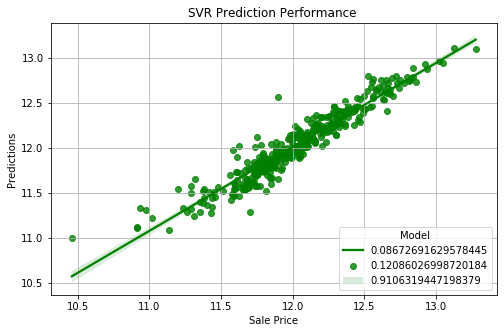

In [59]:
print('with \scaled features:')
svr2 = SVR(C=50, gamma=0.001)#-0.04066
print(cv_rmse(svr2))
svr2.fit(X2_train,y_train)
svr2_pred = svr2.predict(X2_test)
print('SVR Performance:')
print('MAE:', metrics.mean_absolute_error(y_test, svr2_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, svr2_pred)))
print('R2_Score: ', metrics.r2_score(y_test, svr2_pred))
fig = plt.figure(figsize=(8, 5))
sns.regplot(y_test,svr2_pred,color='g')
plt.xlabel('Sale Price') 
plt.ylabel('Predictions') 
plt.title('SVR Prediction Performance ') 
plt.grid()
MAE = metrics.mean_absolute_error(y_test, svr2_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, svr2_pred))
R2_Score = metrics.r2_score(y_test, svr2_pred)
plt.legend(title='Model', loc='lower right', labels=[MAE,RMSE,R2_Score])
plt.show()

In [60]:
# for submission
X_test = df1_final

sc_X = RobustScaler()
X2 = sc_X.fit_transform(X)
X2_test = sc_X.transform(X_test)

In [61]:
predss2 = (gbm2.predict(X2_test)*0.5 + rg2.predict(X2_test)*0.5)

sub['SalePrice'] = pd.DataFrame(np.floor(np.expm1(predss2)),columns=['SalePrice'])

q1 = sub['SalePrice'].quantile(0.045)
q2 = sub['SalePrice'].quantile(0.99)

print(sub['SalePrice'].skew(),'   ',sub['SalePrice'].kurt())
sub['SalePrice'] = sub['SalePrice'].apply(lambda x: x if x > q1 else x*0.8)
sub['SalePrice'] = sub['SalePrice'].apply(lambda x: x if x < q2 else x*1.1)

print(sub['SalePrice'].skew(),'   ',sub['SalePrice'].kurt())

sub['SalePrice'] *= 1.0099619
sub.to_csv("submission_last.csv", index=False)#0.13877


1.618206830412693     3.467145267980296
1.76522742796513     4.877720662923173
